In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

In [2]:
import sys
sys.path.append("/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/")

from vis_statistics import plot_cluster_statistics, plot_clusters_comparison
from vis_lc import get_lc_path, plot_cluster_lcs
from vis_periodogram import plot_cluster_periodograms, plot_cluster_periodograms_specific, plot_lsp_comparison
from vis_periodogram import plot_cluster_lsp

from visualize_gp_afterfit import *

## Load master table

In [3]:
from astropy.table import Table

tbl = Table.read('../master_table.fits')

scalar_cols = [name for name in tbl.colnames if len(tbl[name].shape) <= 1]
multi_cols  = [name for name in tbl.colnames if len(tbl[name].shape) >  1]

master_table = tbl[scalar_cols].to_pandas()

for col in multi_cols:
    master_table[col] = list(tbl[col])

print(master_table.shape)
master_table.head()

(868, 26)


,name,rms,std,MAD,sigmaG,skewness,von_neumann_ratio,J_Stetson,max_power,freq_at_max_power,...,SumLSP_7_4_Day_Power,SumLSP_4_1_Day_Power,SumLSP_1_p5_Day_Power,Entropy,sectors,cadence,n_sectors,LOC,AGE,FullPeriodogram
0,b'BMG32',0.061409,0.000668,0.000434,0.000639,0.397087,0.000783,0.935988,0.046111,0.36,...,0.206012,0.528081,0.173964,6.981934,[0],30.0,1,b'LMC',7.9,"[0.026436947727934403, 0.02746316684230981, 0...."
1,b'BMG32',0.161769,0.001006,0.000719,0.001065,-3.085452,0.001452,1.434224,0.174483,0.32,...,0.170952,1.841990,0.271482,6.934397,[1],30.0,1,b'LMC',7.9,"[0.002725964423310637, 0.007146544857656363, 0..."
2,b'BMG32',0.112893,0.001003,0.000626,0.000927,17.266732,0.001003,1.377425,0.174913,0.19,...,0.702348,1.005133,0.103512,7.047517,[2],30.0,1,b'LMC',7.9,"[0.05205991154852454, 0.07989218713552883, 0.0..."
3,b'BMG32',0.119027,0.001056,0.000722,0.001067,-2.638127,0.001146,1.451241,0.112790,0.37,...,0.451855,1.091927,0.113481,7.156956,[3],30.0,1,b'LMC',7.9,"[0.0703332776487653, 0.05668259486342891, 0.03..."
4,b'BMG32',0.061409,0.000850,0.000546,0.000811,-1.767441,0.000560,1.179916,0.068967,0.37,...,0.100536,0.647467,0.117497,7.651595,"[0, 1]",30.0,2,b'LMC',7.9,"[0.006778285831005086, 0.013017152060444029, 0..."


In [4]:
print(master_table.columns)

Index(['name', 'rms', 'std', 'MAD', 'sigmaG', 'skewness', 'von_neumann_ratio',
       'J_Stetson', 'max_power', 'freq_at_max_power', 'n_peaks',
       'ratio_of_power_at_high_v_low_freq', 'FAP', 'max_autocorrelation',
       'time_of_max_autocorrelation', 'SumLSP_10_7_Day_Power',
       'SumLSP_7_4_Day_Power', 'SumLSP_4_1_Day_Power', 'SumLSP_1_p5_Day_Power',
       'Entropy', 'sectors', 'cadence', 'n_sectors', 'LOC', 'AGE',
       'FullPeriodogram'],
      dtype='str')


In [5]:
new_table = master_table[['name', 'sectors', 'cadence', 'n_sectors', 'LOC', 'AGE']].copy()

In [6]:
new_table

,name,sectors,cadence,n_sectors,LOC,AGE
0,b'BMG32',[0],30.0,1,b'LMC',7.90
1,b'BMG32',[1],30.0,1,b'LMC',7.90
2,b'BMG32',[2],30.0,1,b'LMC',7.90
3,b'BMG32',[3],30.0,1,b'LMC',7.90
4,b'BMG32',"[0, 1]",30.0,2,b'LMC',7.90
...,...,...,...,...,...,...
863,b'SAURER 6',"[2, 3]",10.0,2,b'MW',9.20
864,b'SAURER 6',"[1, 2, 3]",10.0,3,b'MW',9.20
865,b'VDBERGH-HAGEN 92',[0],30.0,1,b'MW',8.91
866,b'VDBERGH-HAGEN 92',[1],30.0,1,b'MW',8.91


## Build updated table

In [7]:
pwd

'/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/GaussianProcesses'

In [8]:



from extract_LC_LSP import add_lightcurves, add_lsps
from invariant_summary_stats import add_variability_metrics
from invariant_LSP import add_invariant_LSP_stats

add_lightcurves(new_table)
add_lsps(new_table, P_min=0.1, P_max=10.0, alpha=5, fap_level=0.01)

[add_lightcurves] processing 868 rows across 55 clusters  |  cadence=30.0 min
[add_lightcurves] done  |  ok=868  missing=0  failed=0
[add_lsps] processing 868 rows  |  P=[0.1, 10.0] days  alpha=5  FAP=0.01  T_effective=True
[add_lsps] done  |  ok=868  skipped=0  failed=0


,name,sectors,cadence,n_sectors,LOC,AGE,LC_t,LC_x,LC_err_x,LSP_freq,LSP_power,LSP_FAP
0,b'BMG32',[0],30.0,1,b'LMC',7.90,"[1382.0534040342682, 1382.0742371425345, 1382....","[1.0000975450628886, 0.9998390715786509, 0.998...","[0.0006122919607540418, 0.0006073373966713103,...","[0.1, 0.10839170102580067, 0.11678340205160134...","[0.031385906327088514, 0.04028827093750009, 0....",0.025225
1,b'BMG32',[1],30.0,1,b'LMC',7.90,"[1410.9283805553364, 1410.9492137124166, 1411....","[0.9959518989804473, 0.9967784422446525, 0.998...","[0.0005083746925240335, 0.0005079584784039902,...","[0.1, 0.1090738263391421, 0.1181476526782842, ...","[0.0005608266419788204, 0.0031543272050171497,...",0.026706
2,b'BMG32',[2],30.0,1,b'LMC',7.90,"[1569.447644895273, 1569.468478380938, 1569.48...","[1.0013508768642108, 0.9995276507017979, 0.998...","[0.001107691177440487, 0.0011245434875321722, ...","[0.1, 0.1079403652130463, 0.1158807304260926, ...","[0.031273467477462326, 0.05857283257603469, 0....",0.023969
3,b'BMG32',[3],30.0,1,b'LMC',7.90,"[1653.948830404778, 1653.969663983743, 1653.99...","[1.000487143665834, 1.000670471719181, 1.00029...","[0.0004794438707843265, 0.0004792852712212794,...","[0.1, 0.10704321537201596, 0.1140864307440319,...","[0.08562990948547126, 0.09200512740769969, 0.0...",0.021693
4,b'BMG32',"[0, 1]",30.0,2,b'LMC',7.90,"[1382.0534040342682, 1382.0742371425345, 1382....","[1.0000975450628886, 0.9998390715786509, 0.998...","[0.0006122919607540418, 0.0006073373966713103,...","[0.1, 0.10435972165094515, 0.10871944330189029...","[0.0031286018190787622, 0.0038488173591969994,...",0.013784
...,...,...,...,...,...,...,...,...,...,...,...,...
863,b'SAURER 6',"[2, 3]",10.0,2,b'MW',9.20,"[2769.9167884451695, 2769.937622284224, 2769.9...","[0.9998862677333421, 0.999875633701568, 0.9997...","[4.274047492678074e-05, 4.273635535963352e-05,...","[0.1, 0.10426984111967216, 0.10853968223934432...","[0.0028019042016180612, 0.0036437531645270448,...",0.013278
864,b'SAURER 6',"[1, 2, 3]",10.0,3,b'MW',9.20,"[2420.0069345704387, 2420.027767841269, 2420.0...","[1.000409940549219, 0.9999722212505378, 1.0001...","[5.2359810627277134e-05, 5.2451677502881545e-0...","[0.1, 0.10276898072228992, 0.10553796144457982...","[0.001936944821248572, 0.002944369487594269, 0...",0.009036
865,b'VDBERGH-HAGEN 92',[0],30.0,1,b'MW',8.91,"[1543.784412772034, 1543.80524656084, 1543.826...","[1.0003120573494295, 1.0006849320573654, 1.000...","[3.471778038086393e-05, 3.448285757645053e-05,...","[0.1, 0.1086174944495052, 0.1172349888990104, ...","[0.10587165306612822, 0.11418969050652934, 0.0...",0.025370
866,b'VDBERGH-HAGEN 92',[1],30.0,1,b'MW',8.91,"[1569.451349827374, 1569.472183108963, 1569.49...","[0.9999328665576012, 1.0000060038037917, 1.000...","[3.9436533405072194e-05, 4.0246802399471696e-0...","[0.1, 0.10794052408189338, 0.11588104816378675...","[0.10567532534871135, 0.1424068514684411, 0.12...",0.023970


# Visualize Single LC/LSP

In [9]:
np.unique(new_table['name']) 

array([b'ASCC 116', b'ASCC 57', b'BASEL 12', b'BASEL 13', b'BERKELEY 50',
       b'BERKELEY 66', b'BERKELEY 83', b'BERKELEY 85', b'BMG32',
       b'BSDL2934', b'CZERNIK 13', b'Cl Kron 27', b'ESO 130-13',
       b'FSR 0154', b'FSR 0165', b'FSR 0167', b'FSR 0333', b'FSR 0951',
       b'IC 1311', b'IC 4996', b'KING 1', b'KMHK1292', b'KMHK1378',
       b'KRONBERGER 31', b'LODEN 481', b'LYNGA 2', b'LYNGA 4',
       b'NGC 2671', b'NGC 2910', b'NGC 4103', b'NGC 6883', b'NGC 6885',
       b'NGC 7086', b'NGC 7175', b'NGC1711', b'NGC1735', b'NGC2093',
       b'NGC2095', b'NGC2114', b'NGC2117', b'NGC2118', b'NGC2130',
       b'NGC2135', b'NGC2153', b'NGC2160', b'NGC2177',
       b'OGLE-CL SMC  297', b'PATCHICK 75', b'RUPRECHT 172',
       b'RUPRECHT 83', b'SAI 132', b'SAURER 6', b'VDBERGH-HAGEN 92',
       b'[SL63] 730', b'[SL63] 741'], dtype=object)

In [45]:
print('hi')

hi


In [9]:
names = np.unique(new_table['name'])

In [10]:
from vis_periodogram import plot_cluster_lsp

# b'BERKELEY 83' #3 ish peaks
# b'BSDL2934'   #lots of little peaks at high period (may be noise)
# b'CZERNIK 13' #lots of nearby peaks
# b'FSR 0165' #kind wierd
# b'FSR 0333' # 2 close peaks
# b'IC 1311' #wierd ringing
# b'IC 4996' #signal but no signficant peaks above fap
# b'KMHK1378' #4 clearish peaks
#  b'[SL63] 730' # just noise

test_name =  b'BERKELEY 83'
#test_name = b'NGC1711'
#test_name = b'NGC 129'


BERKELEY 83  —  4 HDU(s)  —  /astro/users/cgwill/TESS_Cluster_Age_ML/light_curves/MW/hlsp_elk_tess_ffi_berkeley-83_tess_v1_llc.fits
  HDU 0: PRIMARY       SECTOR=—     TIMEDEL=—           nrows=0
  HDU 1:               SECTOR=14    TIMEDEL=—           nrows=717
  HDU 2:               SECTOR=41    TIMEDEL=—           nrows=3658
  HDU 3:               SECTOR=54    TIMEDEL=—           nrows=2819
  HDU 4:               SECTOR=55    TIMEDEL=—           nrows=3771


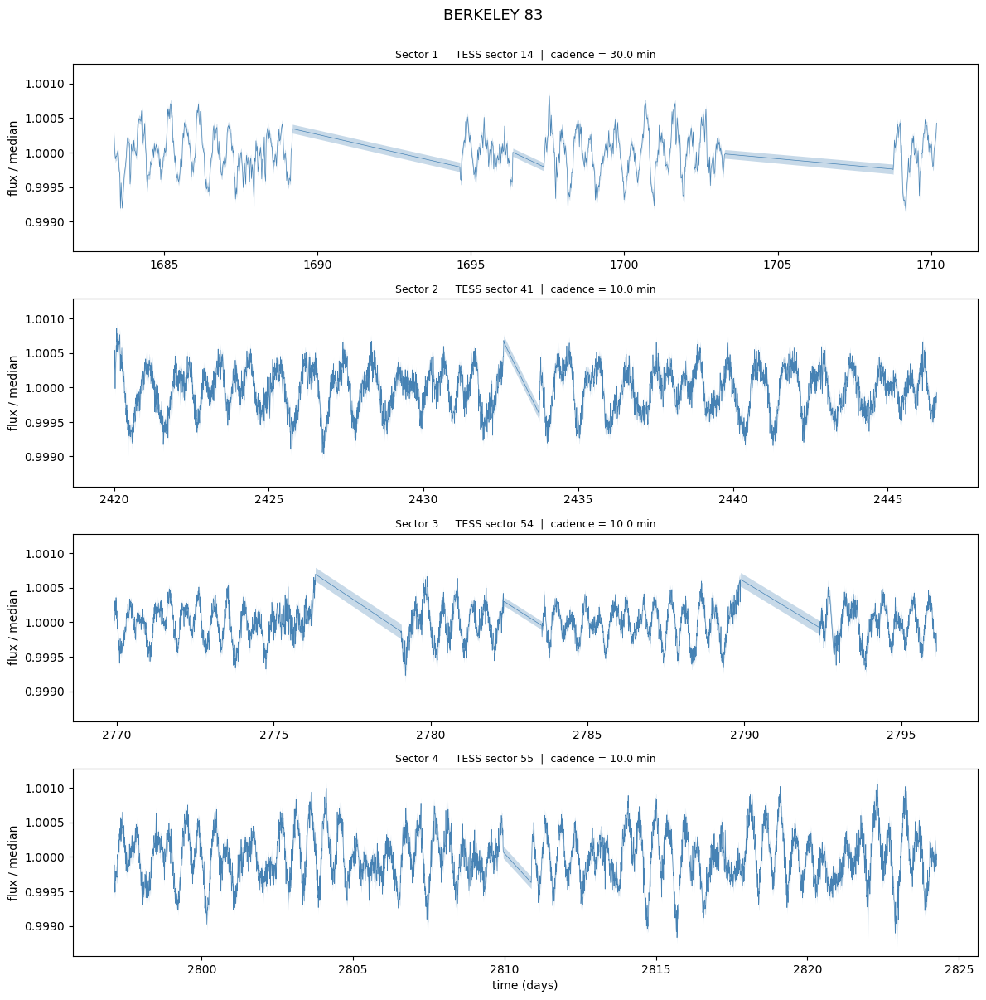

In [18]:

plot_cluster_lcs(new_table, test_name, plot_errors=True) #looks up the raw LC file and shows it.
#plot_cluster_lcs(new_table, test_name, x_zoom=0.25, plot_errors=True) #looks up the raw LC file and shows it.
#plot_cluster_lcs(new_table, test_name, x_zoom=0.25, plot_errors=True, resample=True) #looks up the raw LC file and shows it.

name:  b'BERKELEY 83'


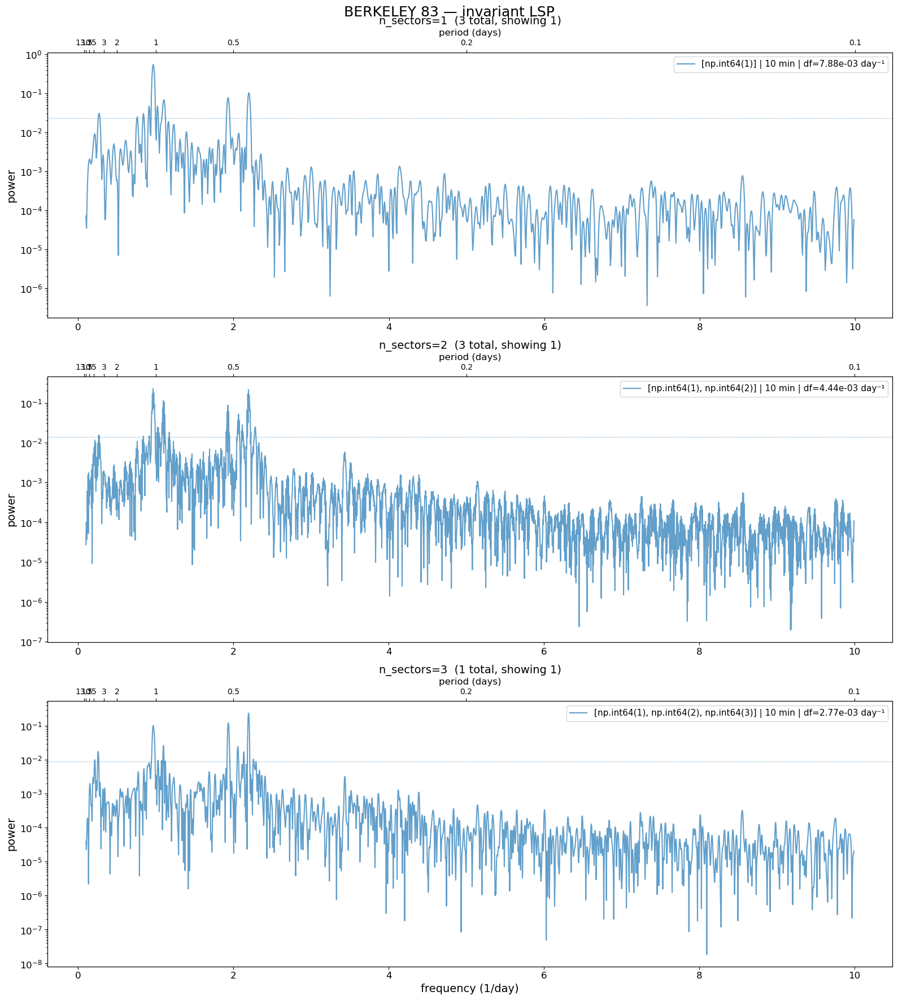

In [21]:

print('name: ', test_name)
plot_cluster_lsp(
    new_table,
    name=test_name,
    max_num_pgs=1,
    yscale='log',
)

# Load GP Stuff

In [9]:
from GP_Fit import *

In [14]:
#new_table['n_sectors']

In [13]:
test_name = b'BERKELEY 83' #3 ish peaks
# b'BSDL2934'   #lots of little peaks at high period (may be noise)
# b'CZERNIK 13' #lots of nearby peaks
# b'FSR 0165' #kind wierd
# b'FSR 0333' # 2 close peaks
# b'IC 1311' #wierd ringing
# b'IC 4996' #signal but no signficant peaks above fap
# b'KMHK1378' #4 clearish peaks
# b'[SL63] 730' # just noise


In [38]:
# subset = new_table[
#     (new_table["name"] == test_name) & 
#     (new_table["n_sectors"] == 1)
# ]

# row = subset.sample(n=1, random_state=42)
# print(row)


# Single LC Test

In [ ]:
subset

name                                             b'CZERNIK 13'
sectors                                                    [2]
cadence                                                   3.33
n_sectors                                                    1
LOC                                                      b'MW'
AGE                                                      6.855
LC_t         [2910.27791207126, 2910.3473564448786, 2910.36...
LC_x         [1.0010169091626593, 1.0001020066331852, 1.000...
LC_err_x     [4.0816043366965994e-05, 4.33112934426229e-05,...
LSP_freq     [0.1, 0.10757705122020064, 0.1151541024404013,...
LSP_power    [0.0007916203246614683, 0.0007974594601492407,...
LSP_FAP                                               0.022504
Name: 746, dtype: object
White-noise bootstrap: 0.6 s
Initial LSP: 0.0 s
Found 7 significant peak(s); fitting up to 7 component(s).
  Peak 1: period=0.546 d, power=0.3928
  Peak 2: period=0.598 d, power=0.0730
  Peak 3: period=0.076 d, power=0.

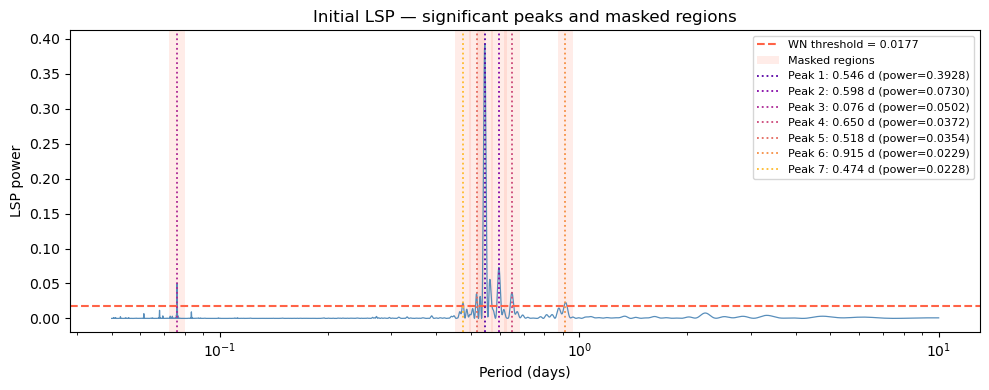

Fitting 1-component model...
  Fit 1 component(s): 13.0 s
  1 component(s): periods=['0.554'] d, BIC=-14969.8


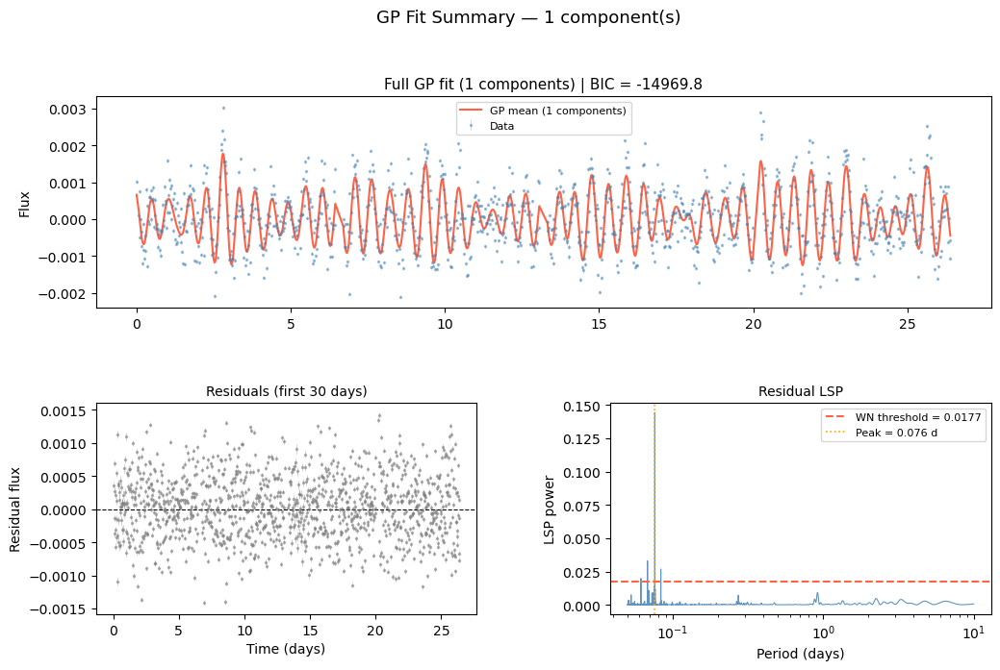

Fitting 2-component model...
  Fit 2 component(s): 3.3 s
  2 component(s): periods=['0.554', '10.000'] d, BIC=-14948.5


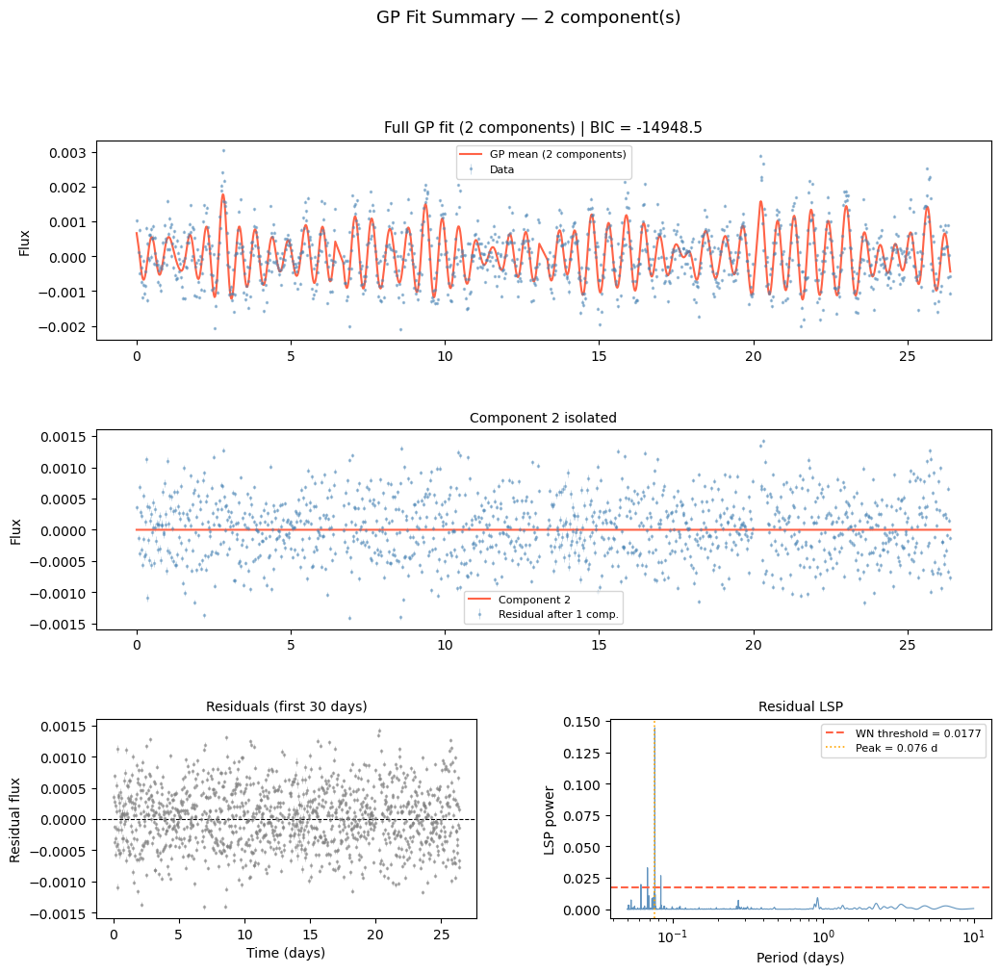

Fitting 3-component model...
  Fit 3 component(s): 4.1 s
  3 component(s): periods=['0.589', '0.546', '0.050'] d, BIC=-15272.4


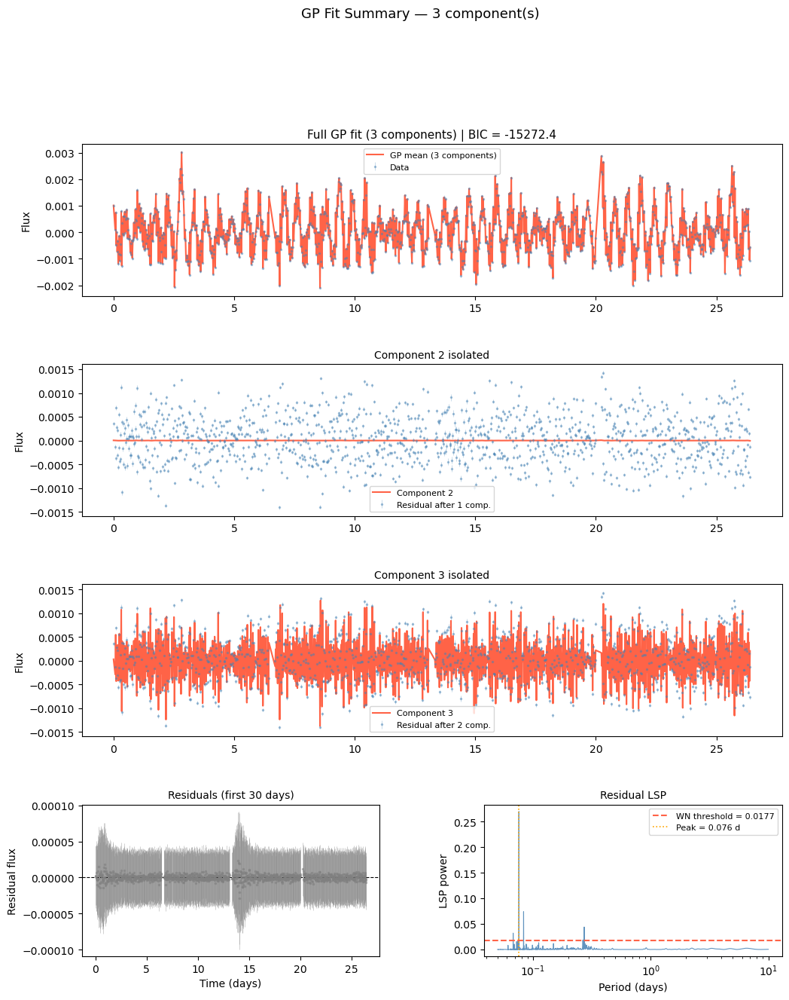

Fitting 4-component model...
  Fit 4 component(s): 8.8 s
  4 component(s): periods=['0.543', '0.597', '0.050', '0.886'] d, BIC=-15268.1


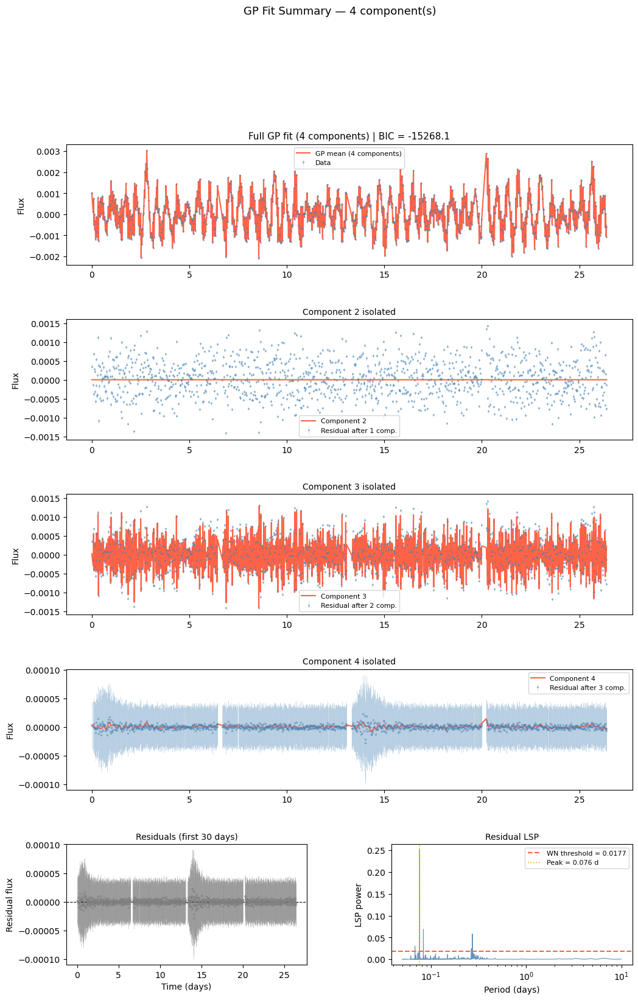

Fitting 5-component model...
  Fit 5 component(s): 13.6 s
  5 component(s): periods=['0.546', '0.811', '0.050', '0.473', '0.597'] d, BIC=-15272.0


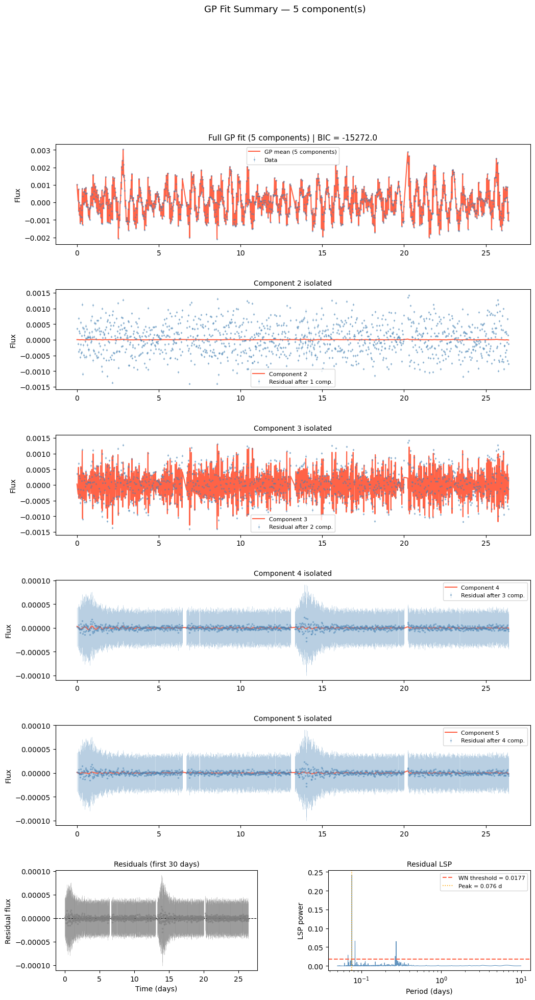

Fitting 6-component model...
  Fit 6 component(s): 17.5 s
  6 component(s): periods=['0.546', '0.597', '0.050', '0.650', '0.473', '0.900'] d, BIC=-15260.2


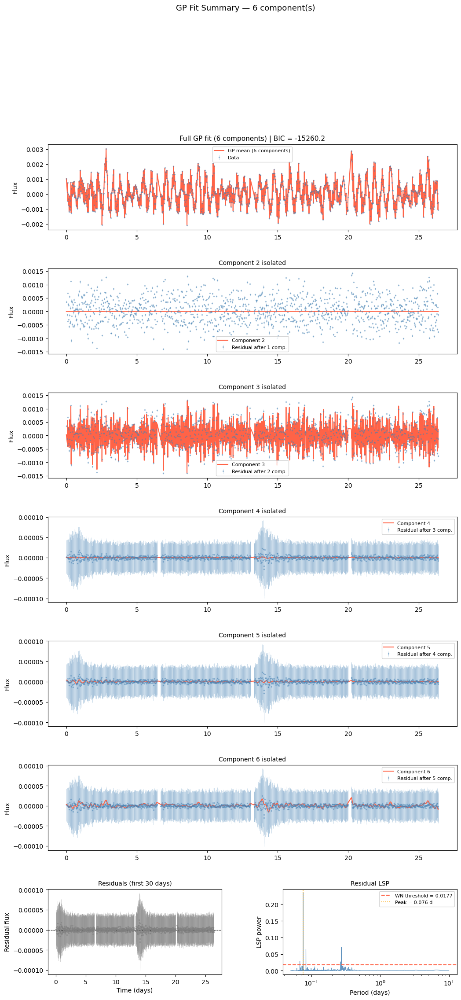

Fitting 7-component model...
  Fit 7 component(s): 15.5 s
  7 component(s): periods=['0.546', '0.597', '0.050', '0.650', '0.546', '0.904', '0.473'] d, BIC=-15238.9


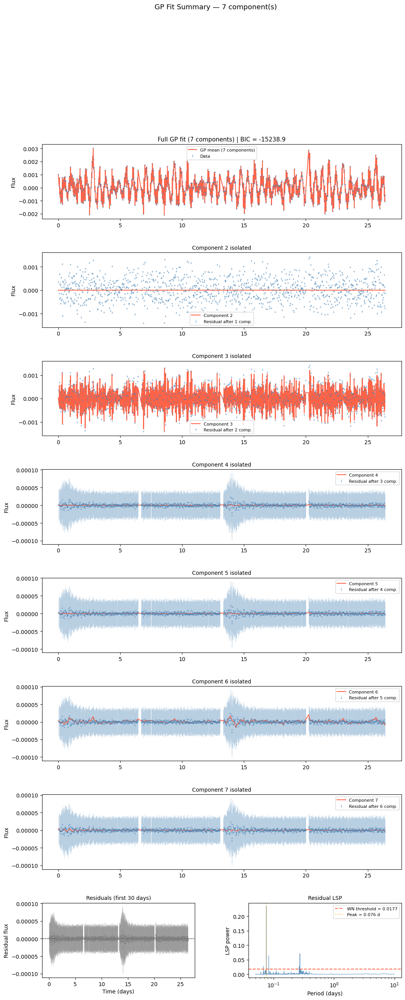


BIC summary (all models):
  m=1: BIC=-14969.8
  m=2: BIC=-14948.5  ΔBIC=-21.3 ~
  m=3: BIC=-15272.4  ΔBIC=+323.9 ✓  ← best
  m=4: BIC=-15268.1  ΔBIC=-4.3 ~
  m=5: BIC=-15272.0  ΔBIC=+3.8 ~
  m=6: BIC=-15260.2  ΔBIC=-11.8 ~
  m=7: BIC=-15238.9  ΔBIC=-21.3 ~

Best model: 3 component(s) (BIC=-15272.4)
Total: 531.2 s


In [46]:

subset = new_table[
    (new_table["name"] == b'CZERNIK 13') & 
    (new_table["n_sectors"] == 1) 
]

row = subset.sample(n=1, random_state=42).iloc[0]
print(row)

t = np.asarray(row['LC_t'])
f = np.asarray(row['LC_x'])
f_err = np.asarray(row['LC_err_x'])

out = iterative_sho_gp_fit(
    t,
    f,
    f_err,
    
    max_components=10,
    min_period=0.05,
    max_period=10.0,
    samples_per_peak=10,

    harmonic_tolerance=0.05,
    harmonic_masking=False,

    Q_min=0.51,
    Q_max=100.0,
    init_Q=5.0,
 
    fit_full_only=False, #If you only want to fit the full curve.
    debug_fitalln=True,  #If this is false, the BIC score improvement threshold may perform early stopping. set to true if you want to fit all componenets.

    bic_improvement_threshold=10.0,
    n_white_noise_boot=200,
    white_noise_percentile=99.0,
    
    random_state=123,
    verbose=2,
    checkpoint_dir='/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/GaussianProcesses/scratch'
)


    # t,
    # norm_flux,
    # flux_err,
    # max_components=6,
    # min_period=0.05,
    # max_period=50.0,
    # samples_per_peak=10,
    # Q_min=0.51,
    # Q_max=100.0,
    # init_Q=10.0,
    # harmonic_tolerance=0.10,
    # harmonic_masking=True,
    # fit_full_only=False,
    # bic_improvement_threshold=10.0,
    # debug_fitalln=False,
    # n_white_noise_boot=200,
    # white_noise_percentile=99.0,
    # random_state=123,
    # verbose=0,
    # checkpoint_dir=None,


In [23]:
#from GP_Fit import load_gp_checkpoint
#out = load_gp_checkpoint("/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/GaussianProcesses/scratch/checkpoint_m10.pkl")

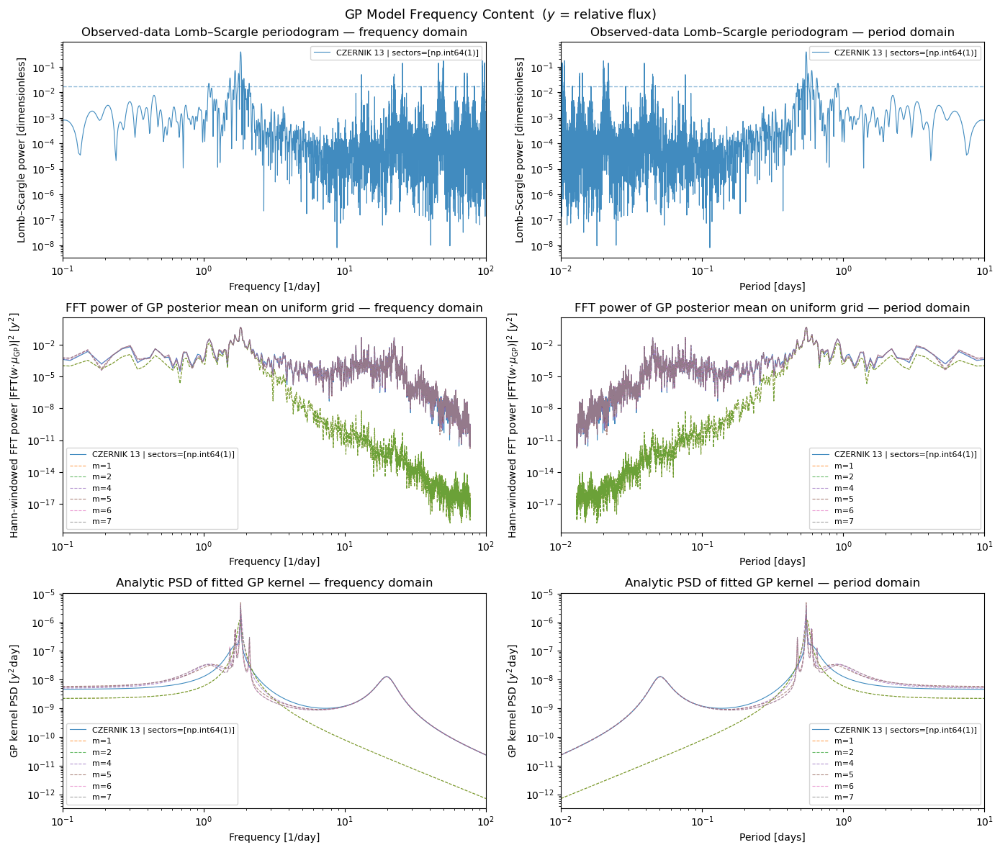

In [48]:
plot_kspace([out], table_rows=subset, window=True, log_y=True, period_lim=(0.01, 10.0), plot_all_ncomponent_fits=True)

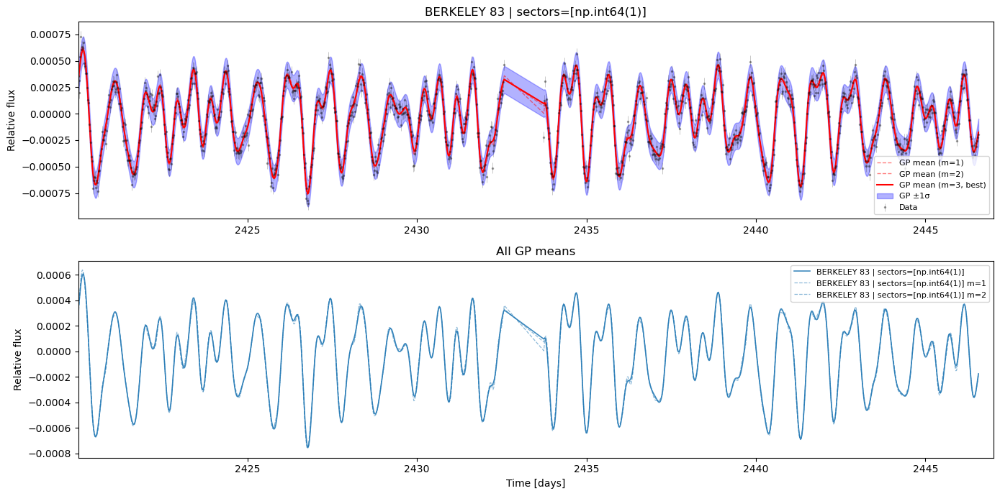

In [66]:
plot_gp_fit([out], table_rows=subset, plot_all_ncomponent_fits=True)

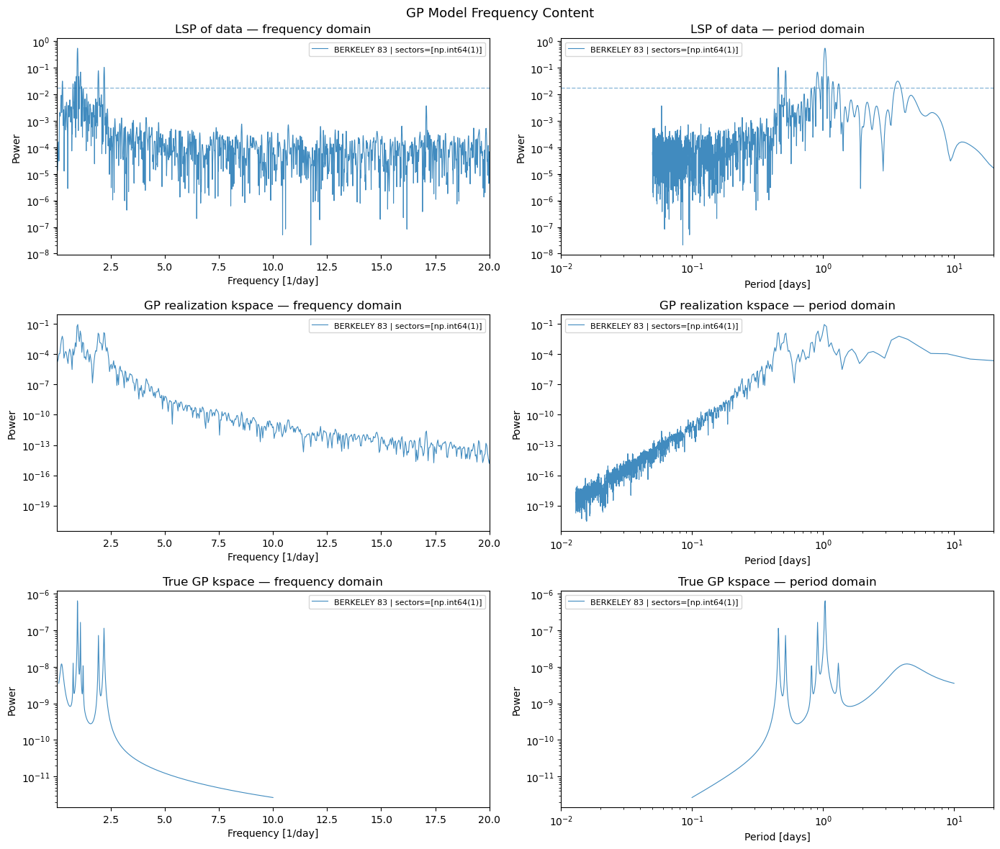

In [26]:
plot_kspace([out], table_rows=subset, window=True, log_y=True)

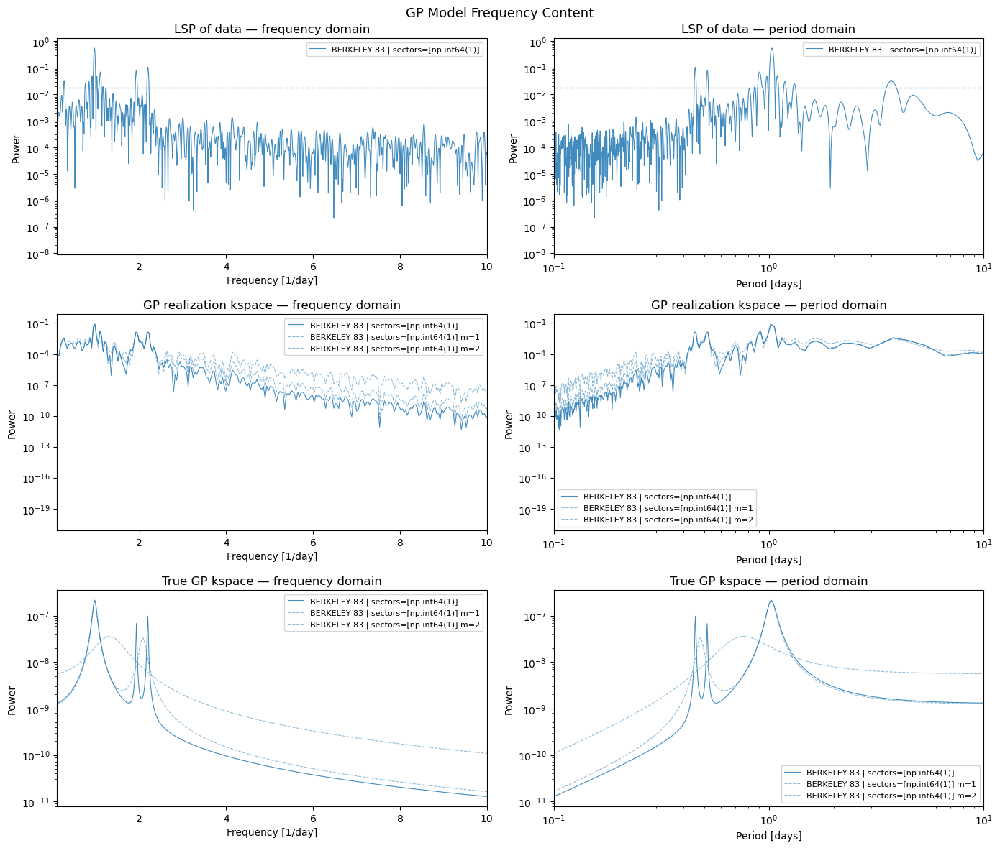

In [18]:
plot_kspace([out], table_rows=subset, window=True, log_y=True, plot_all_ncomponent_fits=True)

# Full Cluster Test

In [55]:
len(output_list)

17

In [9]:
len(subset)

NameError: name 'subset' is not defined

name                                            b'BERKELEY 83'
sectors                                                    [1]
cadence                                                   10.0
n_sectors                                                    1
LOC                                                      b'MW'
AGE                                                      8.685
LC_t         [2420.007865195888, 2420.028698542932, 2420.04...
LC_x         [1.000353196245348, 1.0001951079980314, 1.0003...
LC_err_x     [5.396594522232019e-05, 5.409274719014432e-05,...
LSP_freq     [0.1, 0.10787755530562083, 0.11575511061124166...
LSP_power    [7.068652193169703e-05, 3.4658641778470285e-05...
LSP_FAP                                               0.022806
Name: 732, dtype: object
White-noise bootstrap: 0.5 s
Initial LSP: 0.0 s
Found 10 significant peak(s); fitting up to 10 component(s).
  Peak 1: period=1.035 d, power=0.5513
  Peak 2: period=0.455 d, power=0.1043
  Peak 3: period=0.518 d, power=

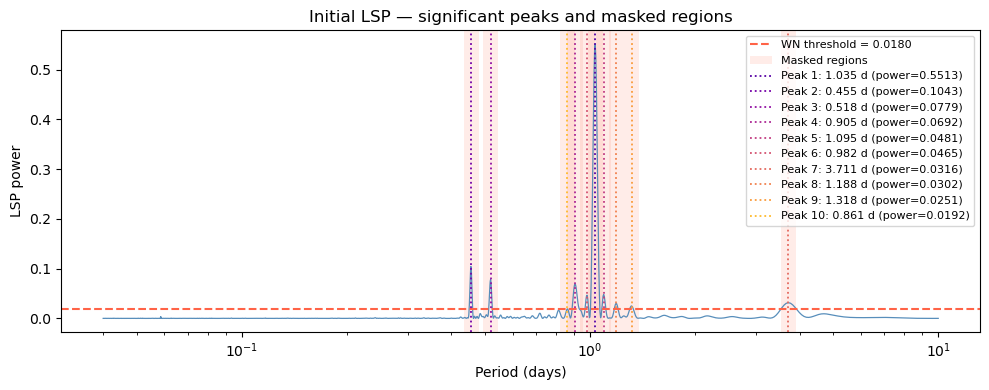

Fitting 1-component model...
  Fit 1 component(s): 1.2 s
  1 component(s): periods=['0.732'] d, BIC=-18975.5
Fitting 2-component model...
  Fit 2 component(s): 2.0 s
  2 component(s): periods=['1.025', '0.480'] d, BIC=-19068.5
Fitting 3-component model...
  Fit 3 component(s): 3.9 s
  3 component(s): periods=['1.027', '0.456', '0.517'] d, BIC=-19091.9
Fitting 4-component model...
  Fit 4 component(s): 4.2 s
  4 component(s): periods=['1.036', '0.455', '0.515', '1.019'] d, BIC=-19067.8
Fitting 5-component model...
  Fit 5 component(s): 15.9 s
  5 component(s): periods=['1.034', '0.455', '0.517', '0.618', '0.909'] d, BIC=-19117.9
Fitting 6-component model...
  Fit 6 component(s): 6.9 s
  6 component(s): periods=['1.027', '0.456', '0.517', '1.026', '1.026', '1.028'] d, BIC=-19027.9
Fitting 7-component model...
  Fit 7 component(s): 10.5 s
  7 component(s): periods=['1.034', '0.456', '0.517', '0.907', '1.034', '1.034', '4.228'] d, BIC=-19058.0
Fitting 8-component model...
  Fit 8 component

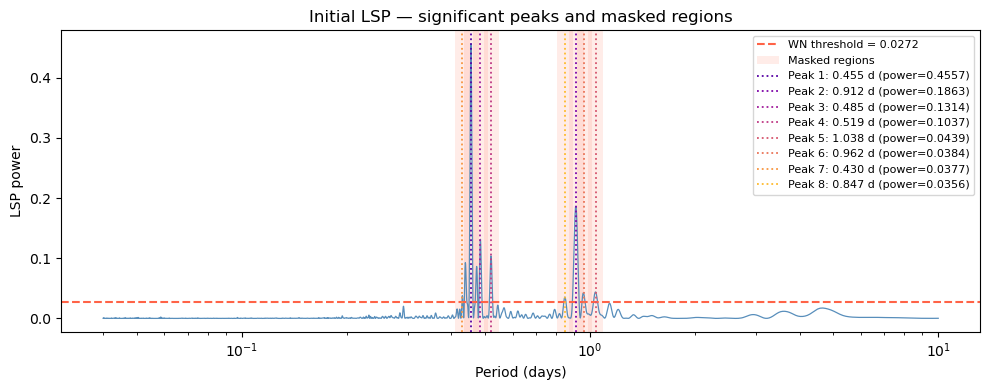

Fitting 1-component model...
  Fit 1 component(s): 1.1 s
  1 component(s): periods=['0.478'] d, BIC=-14744.3
Fitting 2-component model...
  Fit 2 component(s): 2.2 s
  2 component(s): periods=['0.440', '0.913'] d, BIC=-14761.7
Fitting 3-component model...
  Fit 3 component(s): 3.3 s
  3 component(s): periods=['0.265', '0.931', '0.462'] d, BIC=-14788.2
Fitting 4-component model...
  Fit 4 component(s): 5.9 s
  4 component(s): periods=['0.265', '0.936', '0.456', '0.515'] d, BIC=-14793.3
Fitting 5-component model...
  Fit 5 component(s): 7.8 s
  5 component(s): periods=['0.265', '0.913', '0.456', '0.516', '1.046'] d, BIC=-14785.5
Fitting 6-component model...
  Fit 6 component(s): 15.7 s
  6 component(s): periods=['0.264', '4.238', '0.455', '0.515', '1.091', '0.912'] d, BIC=-14781.3
Fitting 7-component model...
  Fit 7 component(s): 19.3 s
  7 component(s): periods=['0.455', '4.228', '0.455', '0.515', '1.093', '0.912', '0.264'] d, BIC=-14760.8
Fitting 8-component model...
  Fit 8 component

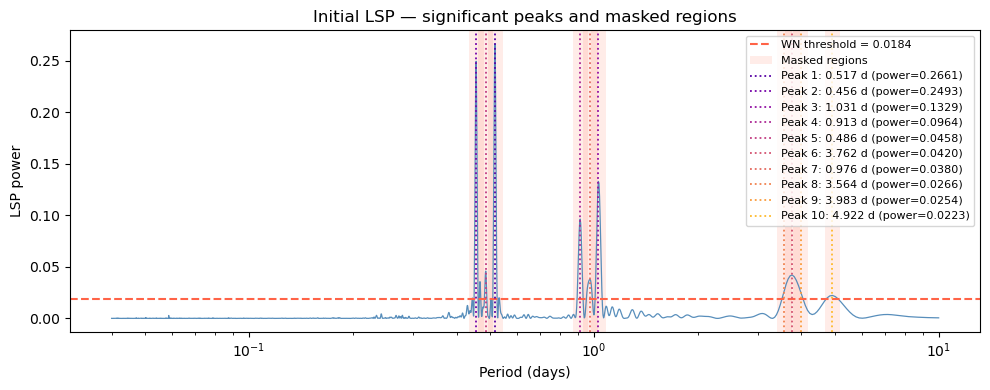

Fitting 1-component model...
  Fit 1 component(s): 1.1 s
  1 component(s): periods=['0.526'] d, BIC=-19225.6
Fitting 2-component model...
  Fit 2 component(s): 2.3 s
  2 component(s): periods=['0.992', '0.476'] d, BIC=-19251.4
Fitting 3-component model...
  Fit 3 component(s): 2.9 s
  3 component(s): periods=['0.476', '0.476', '0.992'] d, BIC=-19230.0
Fitting 4-component model...
  Fit 4 component(s): 9.7 s
  4 component(s): periods=['0.517', '0.456', '0.986', '0.450'] d, BIC=-19305.3
Fitting 5-component model...
  Fit 5 component(s): 7.9 s
  5 component(s): periods=['0.456', '0.456', '1.031', '0.914', '0.517'] d, BIC=-19301.5
Fitting 6-component model...
  Fit 6 component(s): 24.9 s
  6 component(s): periods=['0.457', '0.517', '0.911', '1.030', '0.253', '3.866'] d, BIC=-19356.9
Fitting 7-component model...
  Fit 7 component(s): 28.2 s
  7 component(s): periods=['0.457', '0.517', '0.912', '1.029', '0.253', '3.875', '1.016'] d, BIC=-19343.1
Fitting 8-component model...
  Fit 8 component

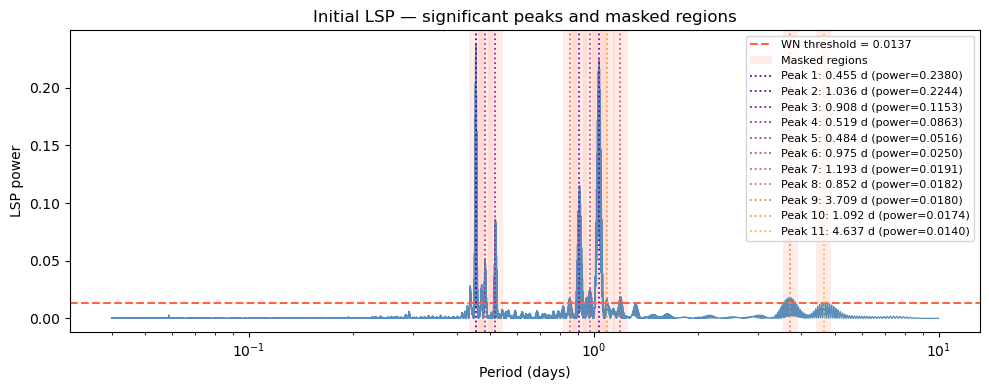

Fitting 1-component model...
  Fit 1 component(s): 1.2 s
  1 component(s): periods=['0.606'] d, BIC=-33675.6
Fitting 2-component model...
  Fit 2 component(s): 2.6 s
  2 component(s): periods=['0.460', '1.010'] d, BIC=-33787.8
Fitting 3-component model...
  Fit 3 component(s): 4.6 s
  3 component(s): periods=['0.470', '1.034', '0.910'] d, BIC=-33801.6
Fitting 4-component model...
  Fit 4 component(s): 7.1 s
  4 component(s): periods=['0.465', '1.034', '0.910', '0.395'] d, BIC=-33861.7
Fitting 5-component model...
  Fit 5 component(s): 12.5 s
  5 component(s): periods=['0.518', '1.035', '0.910', '0.377', '0.456'] d, BIC=-33918.7
Fitting 6-component model...
  Fit 6 component(s): 24.9 s
  6 component(s): periods=['0.470', '1.036', '0.910', '4.181', '0.259', '1.038'] d, BIC=-33870.5
Fitting 7-component model...
  Fit 7 component(s): 41.8 s
  7 component(s): periods=['0.470', '1.035', '0.910', '0.259', '4.161', '1.035', '1.177'] d, BIC=-33859.2
Fitting 8-component model...
  Fit 8 componen

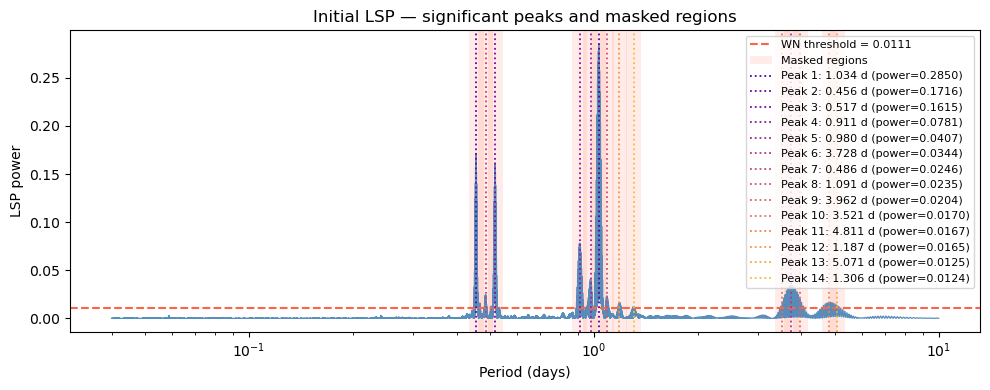

Fitting 1-component model...
  Fit 1 component(s): 1.2 s
  1 component(s): periods=['0.585'] d, BIC=-38139.4
Fitting 2-component model...
  Fit 2 component(s): 2.4 s
  2 component(s): periods=['1.015', '0.477'] d, BIC=-38284.5
Fitting 3-component model...
  Fit 3 component(s): 2.9 s
  3 component(s): periods=['1.015', '0.477', '0.478'] d, BIC=-38261.1
Fitting 4-component model...
  Fit 4 component(s): 11.3 s
  4 component(s): periods=['1.012', '0.517', '0.456', '0.458'] d, BIC=-38426.9
Fitting 5-component model...
  Fit 5 component(s): 14.1 s
  5 component(s): periods=['1.034', '0.479', '0.509', '0.911', '1.034'] d, BIC=-38335.8
Fitting 6-component model...
  Fit 6 component(s): 22.8 s
  6 component(s): periods=['1.034', '0.454', '0.517', '0.911', '1.034', '3.919'] d, BIC=-38331.6
Fitting 7-component model...
  Fit 7 component(s): 54.2 s
  7 component(s): periods=['1.034', '0.517', '0.251', '0.910', '0.955', '3.913', '0.457'] d, BIC=-38526.7
Fitting 8-component model...
  Fit 8 compone

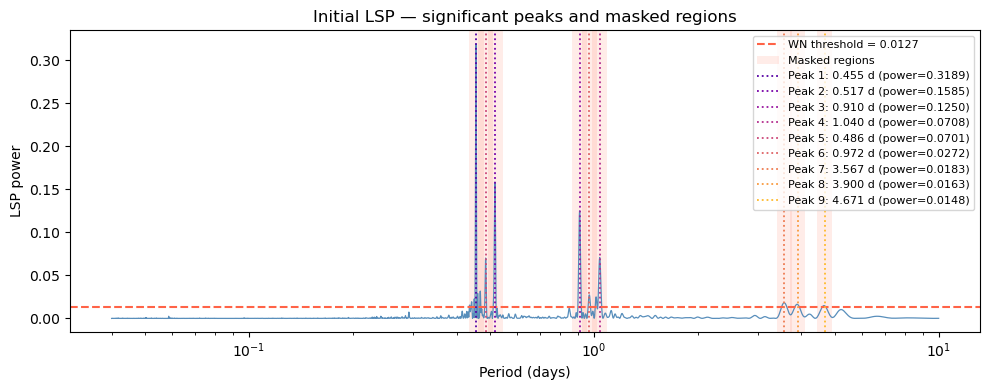

Fitting 1-component model...
  Fit 1 component(s): 1.2 s
  1 component(s): periods=['0.512'] d, BIC=-33965.7
Fitting 2-component model...
  Fit 2 component(s): 2.8 s
  2 component(s): periods=['0.473', '0.579'] d, BIC=-34005.4
Fitting 3-component model...
  Fit 3 component(s): 4.7 s
  3 component(s): periods=['0.404', '0.475', '0.961'] d, BIC=-34046.8
Fitting 4-component model...
  Fit 4 component(s): 8.4 s
  4 component(s): periods=['0.421', '0.475', '0.910', '1.033'] d, BIC=-34054.3
Fitting 5-component model...
  Fit 5 component(s): 14.4 s
  5 component(s): periods=['0.516', '0.456', '0.910', '1.032', '0.404'] d, BIC=-34123.9
Fitting 6-component model...
  Fit 6 component(s): 15.6 s
  6 component(s): periods=['0.405', '0.456', '0.910', '0.910', '0.516', '1.032'] d, BIC=-34100.6
Fitting 7-component model...
  Fit 7 component(s): 40.1 s
  7 component(s): periods=['0.456', '0.260', '1.038', '0.910', '0.514', '0.910', '3.912'] d, BIC=-34186.8
Fitting 8-component model...
  Fit 8 componen

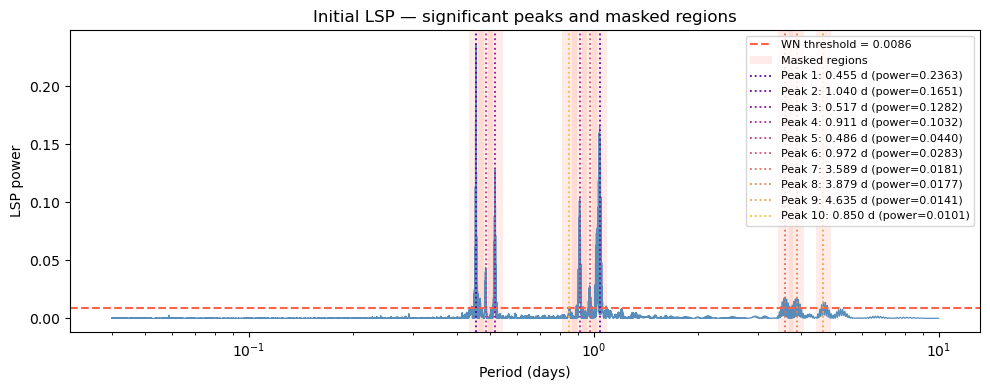

Fitting 1-component model...
  Fit 1 component(s): 1.5 s
  1 component(s): periods=['0.561'] d, BIC=-52876.3
Fitting 2-component model...
  Fit 2 component(s): 2.4 s
  2 component(s): periods=['0.472', '1.004'] d, BIC=-53037.2
Fitting 3-component model...
  Fit 3 component(s): 3.4 s
  3 component(s): periods=['0.471', '1.005', '0.472'] d, BIC=-53012.8
Fitting 4-component model...
  Fit 4 component(s): 11.5 s
  4 component(s): periods=['0.437', '1.034', '0.475', '0.910'] d, BIC=-53159.1
Fitting 5-component model...
  Fit 5 component(s): 14.8 s
  5 component(s): periods=['0.516', '1.034', '0.456', '0.910', '0.419'] d, BIC=-53282.7
Fitting 6-component model...
  Fit 6 component(s): 5.7 s
  6 component(s): periods=['0.474', '1.032', '0.482', '0.919', '0.472', '1.035'] d, BIC=-52958.2
Fitting 7-component model...
  Fit 7 component(s): 58.2 s
  7 component(s): periods=['0.456', '1.216', '0.514', '1.035', '0.259', '0.910', '3.940'] d, BIC=-53357.0
Fitting 8-component model...
  Fit 8 componen

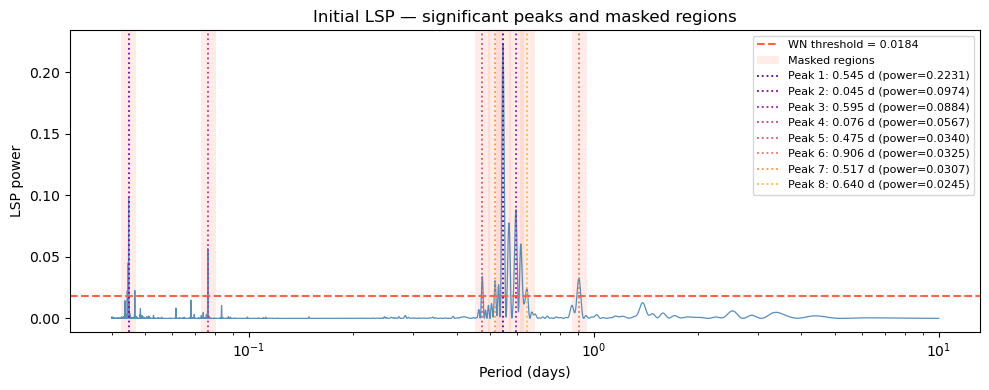

Fitting 1-component model...
  Fit 1 component(s): 1.2 s
  1 component(s): periods=['0.563'] d, BIC=-15379.2
Fitting 2-component model...
  Fit 2 component(s): 2.4 s
  2 component(s): periods=['0.568', '0.041'] d, BIC=-15840.9
Fitting 3-component model...
  Fit 3 component(s): 3.6 s
  3 component(s): periods=['0.545', '0.041', '0.585'] d, BIC=-15827.3
Fitting 4-component model...
  Fit 4 component(s): 7.4 s
  4 component(s): periods=['0.559', '0.045', '0.559', '0.074'] d, BIC=-16489.9
Fitting 5-component model...
  Fit 5 component(s): 7.5 s
  5 component(s): periods=['0.559', '0.045', '0.559', '0.074', '0.561'] d, BIC=-16467.8
Fitting 6-component model...
  Fit 6 component(s): 9.3 s
  6 component(s): periods=['0.556', '0.045', '0.551', '0.074', '0.548', '0.903'] d, BIC=-16458.6
Fitting 7-component model...
  Fit 7 component(s): 29.6 s
  7 component(s): periods=['0.475', '0.045', '0.545', '0.074', '0.452', '0.902', '0.602'] d, BIC=-16483.0
Fitting 8-component model...
  Fit 8 component(

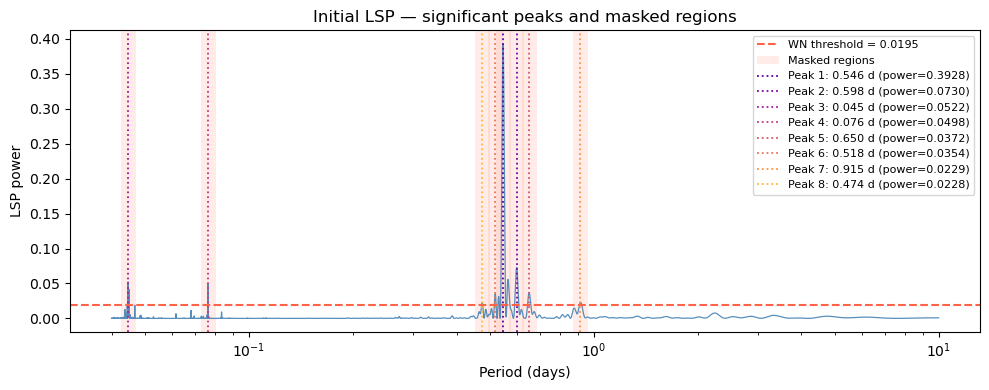

Fitting 1-component model...
  Fit 1 component(s): 1.2 s
  1 component(s): periods=['0.554'] d, BIC=-14969.8
Fitting 2-component model...
  Fit 2 component(s): 3.0 s
  2 component(s): periods=['0.550', '0.911'] d, BIC=-14979.6
Fitting 3-component model...
  Fit 3 component(s): 3.8 s
  3 component(s): periods=['0.546', '0.589', '0.041'] d, BIC=-15421.9
Fitting 4-component model...
  Fit 4 component(s): 9.7 s
  4 component(s): periods=['0.546', '0.578', '0.045', '0.074'] d, BIC=-16089.0
Fitting 5-component model...
  Fit 5 component(s): 13.2 s
  5 component(s): periods=['0.578', '0.597', '0.045', '0.074', '0.546'] d, BIC=-16077.2
Fitting 6-component model...
  Fit 6 component(s): 21.1 s
  6 component(s): periods=['0.546', '0.618', '0.045', '0.074', '0.473', '0.597'] d, BIC=-16076.8
Fitting 7-component model...
  Fit 7 component(s): 12.3 s
  7 component(s): periods=['0.547', '0.548', '0.045', '0.074', '0.569', '0.546', '0.908'] d, BIC=-16025.6
Fitting 8-component model...
  Fit 8 componen

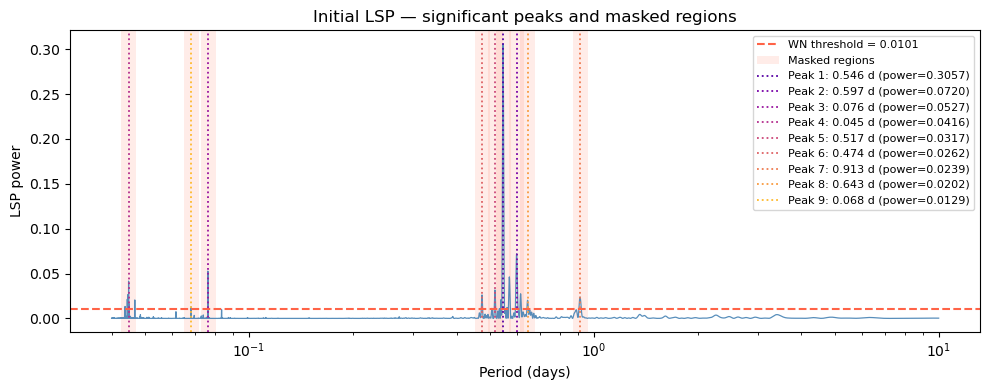

Fitting 1-component model...
  Fit 1 component(s): 1.3 s
  1 component(s): periods=['0.559'] d, BIC=-30353.3
Fitting 2-component model...
  Fit 2 component(s): 3.8 s
  2 component(s): periods=['0.582', '0.545'] d, BIC=-30349.3
Fitting 3-component model...
  Fit 3 component(s): 6.1 s
  3 component(s): periods=['0.587', '0.545', '0.041'] d, BIC=-31292.9
Fitting 4-component model...
  Fit 4 component(s): 18.1 s
  4 component(s): periods=['0.573', '0.545', '0.074', '0.045'] d, BIC=-32642.6
Fitting 5-component model...
  Fit 5 component(s): 24.5 s
  5 component(s): periods=['0.545', '0.559', '0.074', '0.045', '0.600'] d, BIC=-32634.1
Fitting 6-component model...
  Fit 6 component(s): 14.5 s
  6 component(s): periods=['0.561', '0.557', '0.074', '0.045', '0.558', '0.561'] d, BIC=-32569.3
Fitting 7-component model...
  Fit 7 component(s): 82.0 s
  7 component(s): periods=['0.473', '0.602', '0.074', '0.045', '0.545', '0.477', '0.909'] d, BIC=-32676.3
Fitting 8-component model...
  Fit 8 compone

In [14]:
subset = new_table[
    #(new_table["name"].isin([b'BERKELEY 83', b'CZERNIK 13', b'KMHK1378'])) 
    (new_table["name"].isin([b'BERKELEY 83', b'CZERNIK 13'])) 

    ]

output_list = [] 

for i in range(0, len(subset)):
    
    row = subset.iloc[i]
    print(row)

    t = np.asarray(row['LC_t'])
    f = np.asarray(row['LC_x'])
    f_err = np.asarray(row['LC_err_x'])
    
    output_list.append(
        iterative_sho_gp_fit(
            t,
            f,
            f_err,
            
            max_components=20,
            min_period=0.04,
            max_period=10.0,
            samples_per_peak=10,
        
            harmonic_tolerance=0.05,
            harmonic_masking=False,
        
            Q_min=0.51,
            Q_max=100.0,
            init_Q=5.0,
         
            fit_full_only=False, #If you only want to fit the full curve.
            debug_fitalln=True, #True turns off early BIC stopping
        
            bic_improvement_threshold=10.0,
            n_white_noise_boot=200,
            white_noise_percentile=99.0,
            
            random_state=123,
            verbose=1,
            #checkpoint_dir='/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/GaussianProcesses/scratch'
        )
    )
    
    #save_fits('/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/GaussianProcesses/scratch', subset_table[:i+1], output_list)
    

In [ ]:
subset.iloc[0:1]#['name']

In [16]:

for i in range(0, len(output_list)):
    plot_kspace(
        output_list[i],
        table_rows=subset.iloc[i:i+1],
        window=True,
        log_y=True,
        period_lim=[4e-2, 10],
        plot_all_ncomponent_fits=True
    
    )

TypeError: plot_kspace() got an unexpected keyword argument 'plot_all_ncomponent_fits'

In [15]:
print('hi')

hi


In [ ]:
#subset_table_loaded, output_list_loaded = load_fits('/astro/users/cgwill/TESS_Cluster_Age_ML/Data_Visualization_CGW/GaussianProcesses/scratch')

In [53]:
subset

,name,sectors,cadence,n_sectors,LOC,AGE,LC_t,LC_x,LC_err_x,LSP_freq,LSP_power,LSP_FAP
732,b'BERKELEY 83',[1],10.0,1,b'MW',8.685,"[2420.007865195888, 2420.028698542932, 2420.04...","[1.000353196245348, 1.0001951079980314, 1.0003...","[5.396594522232019e-05, 5.409274719014432e-05,...","[0.1, 0.10787755530562083, 0.11575511061124166...","[7.068652193169703e-05, 3.4658641778470285e-05...",0.022806
733,b'BERKELEY 83',[2],10.0,1,b'MW',8.685,"[2769.9167884451695, 2769.937622284224, 2769.9...","[1.0000644070316689, 1.000259509204112, 1.0001...","[3.5818390179752516e-05, 3.58181224456102e-05,...","[0.10151466853077548, 0.11166613538385303, 0.1...","[0.00015595767138861167, 0.0001855260256050923...",0.029118
734,b'BERKELEY 83',[3],10.0,1,b'MW',8.685,"[2797.1184312364835, 2797.139264609154, 2797.1...","[0.9997786177755194, 0.9995360553482615, 0.999...","[5.0901181273058466e-05, 5.090374355491446e-05...","[0.1, 0.10736958666854227, 0.11473917333708451...","[0.0005445256229933027, 0.0007720646061455813,...",0.022168
735,b'BERKELEY 83',"[1, 2]",10.0,2,b'MW',8.685,"[2420.007865195888, 2420.028698542932, 2420.04...","[1.000353196245348, 1.0001951079980314, 1.0003...","[5.396594522232019e-05, 5.409274719014432e-05,...","[0.1, 0.10443555623063633, 0.10887111246127266...","[2.7173367815486048e-05, 9.922438956532168e-05...",0.013907
736,b'BERKELEY 83',"[1, 3]",10.0,2,b'MW',8.685,"[2420.007865195888, 2420.028698542932, 2420.04...","[1.000353196245348, 1.0001951079980314, 1.0003...","[5.396594522232019e-05, 5.409274719014432e-05,...","[0.1, 0.10380755466561425, 0.10761510933122852...","[3.542404953651095e-05, 0.00036920770703765155...",0.012243
737,b'BERKELEY 83',"[2, 3]",10.0,2,b'MW',8.685,"[2769.9167884451695, 2769.937622284224, 2769.9...","[1.0000644070316689, 1.000259509204112, 1.0001...","[3.5818390179752516e-05, 3.58181224456102e-05,...","[0.1, 0.10426984111967216, 0.10853968223934432...","[0.00010787963048132751, 5.515411314458063e-05...",0.013274
738,b'BERKELEY 83',"[1, 2, 3]",10.0,3,b'MW',8.685,"[2420.007865195888, 2420.028698542932, 2420.04...","[1.000353196245348, 1.0001951079980314, 1.0003...","[5.396594522232019e-05, 5.409274719014432e-05,...","[0.1, 0.10276898097244902, 0.10553796194489802...","[3.9815395867976384e-05, 2.9404324831770072e-0...",0.009013


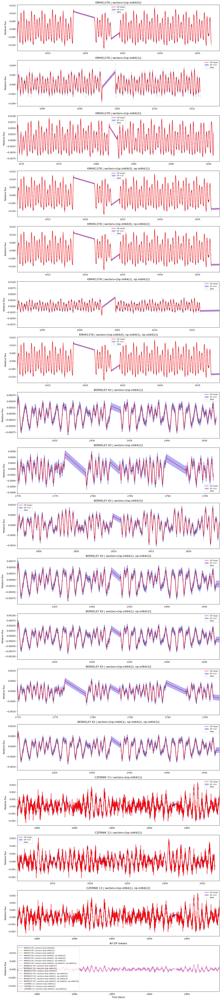

In [20]:
plot_gp_fit(output_list, table_rows=subset)

In [28]:
i = subset["name"].isin([b"BERKELEY 83"])
i

90     False
91     False
92     False
93     False
94     False
95     False
96     False
732     True
733     True
734     True
735     True
736     True
737     True
738     True
745    False
746    False
747    False
Name: name, dtype: bool

In [30]:
output_list[i]

TypeError: list indices must be integers or slices, not Series

In [60]:
subset["name"].isin([b"BERKELEY 83"])

90     False
91     False
92     False
93     False
94     False
95     False
96     False
732     True
733     True
734     True
735     True
736     True
737     True
738     True
745    False
746    False
747    False
Name: name, dtype: bool

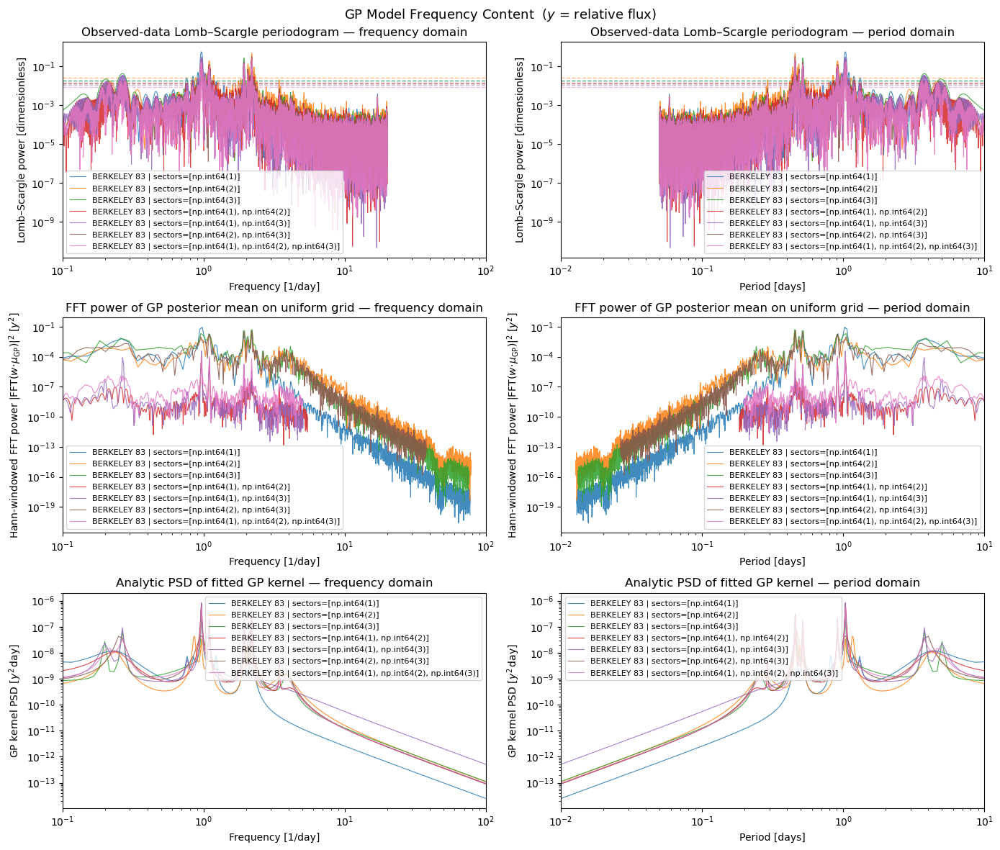

In [39]:
i = subset["name"].isin([b"BERKELEY 83"])

subset_i = subset.loc[i]
outputs_i = [out for out, keep in zip(output_list, i) if keep]

plot_kspace(
    outputs_i,
    table_rows=subset_i,
    window=True,
    log_y=True,
    period_lim=[1e-2, 10]

)

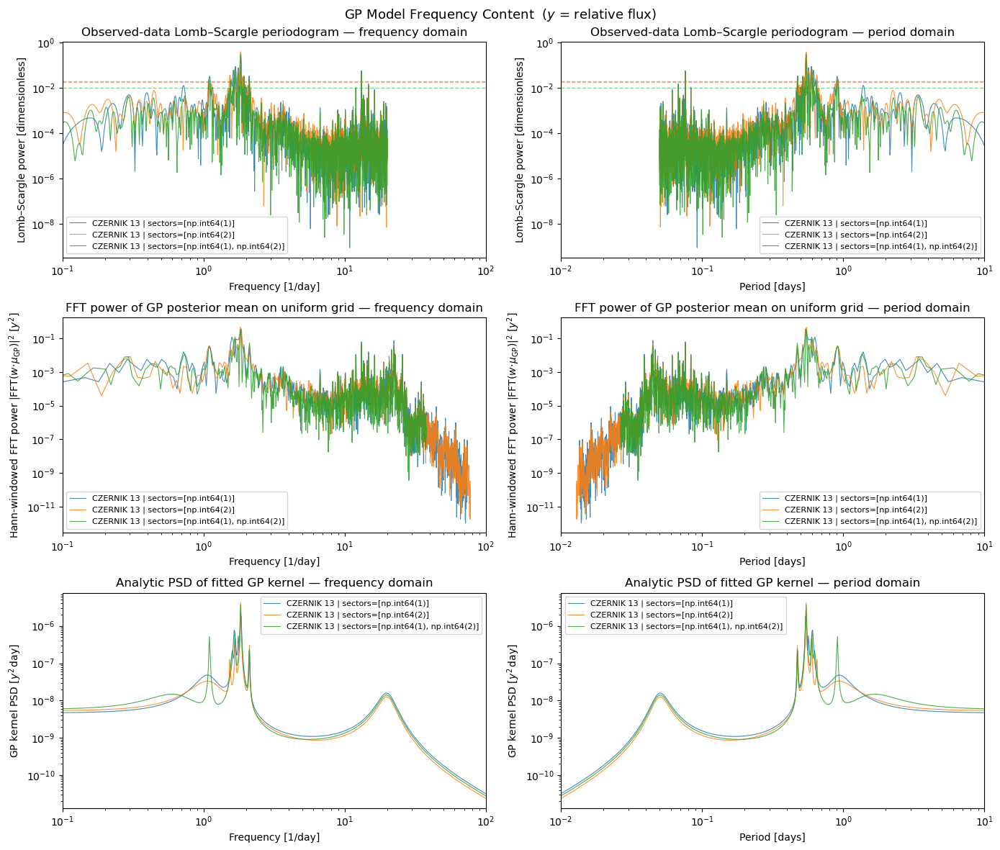

In [38]:
i = subset["name"].isin([b'CZERNIK 13'])

subset_i = subset.loc[i]
outputs_i = [out for out, keep in zip(output_list, i) if keep]

plot_kspace(
    outputs_i,
    table_rows=subset_i,
    window=True,
    log_y=True,
    period_lim=[1e-2, 10]
)

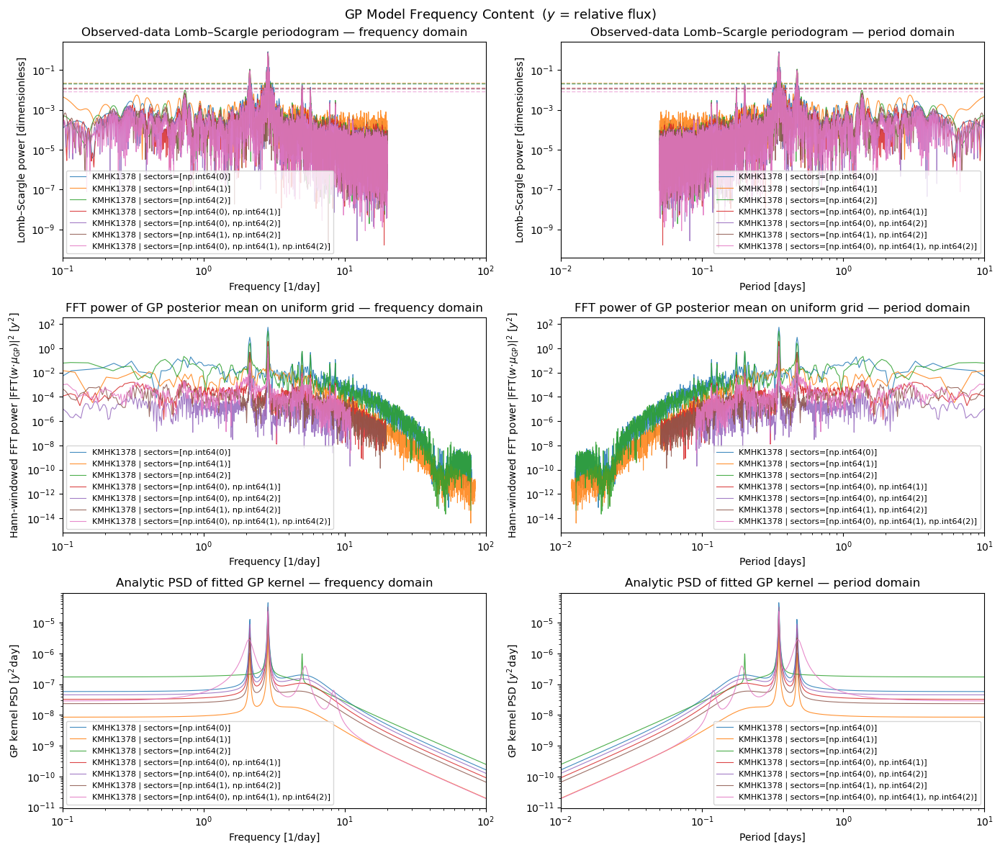

In [41]:
i = subset["name"].isin([b'KMHK1378'])

subset_i = subset.loc[i]
outputs_i = [out for out, keep in zip(output_list, i) if keep]

plot_kspace(
    outputs_i,
    table_rows=subset_i,
    window=True,
    log_y=True,
    period_lim=[1e-2, 10]

)

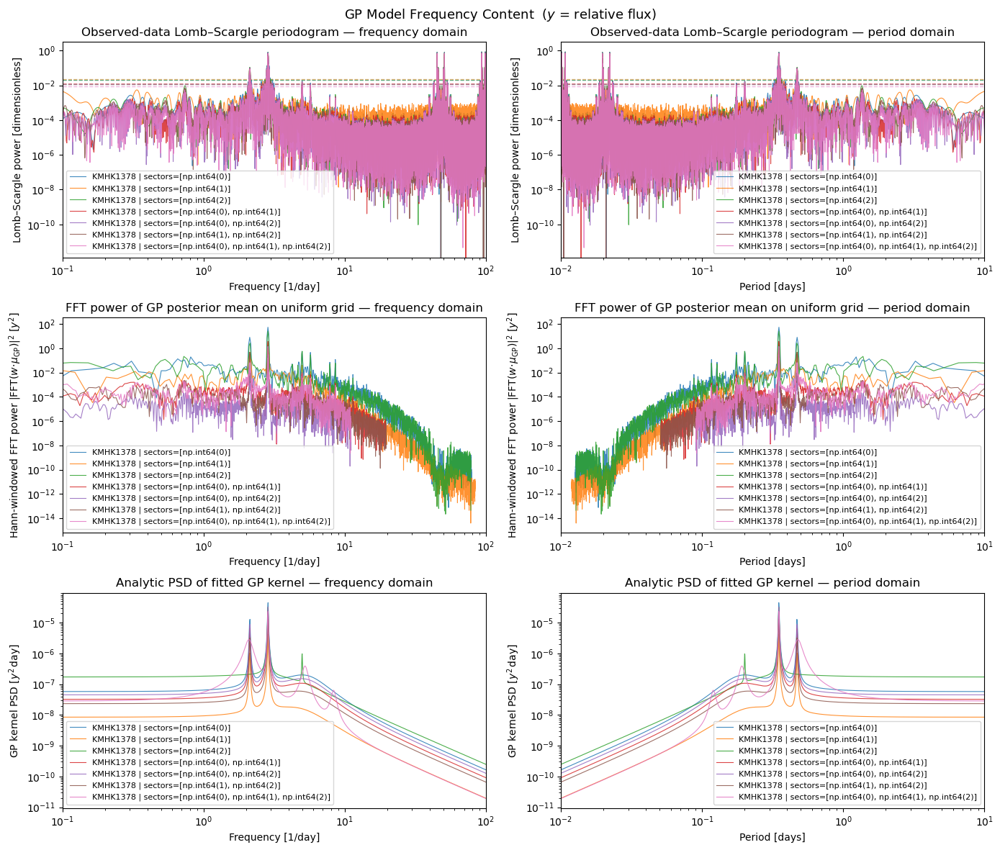

In [42]:
i = subset["name"].isin([b'KMHK1378'])

subset_i = subset.loc[i]
outputs_i = [out for out, keep in zip(output_list, i) if keep]

plot_kspace(
    outputs_i,
    table_rows=subset_i,
    window=True,
    log_y=True,
    period_lim=[1e-2, 10]

)

In [44]:
print('hi')

hi


In [33]:
from gp_summary_stats import add_gp_summary_stats

# Default: 3 log-spaced bins from 0.5–10 days
#subset = add_gp_summary_stats(subset, output_list)

# Custom bin count
#subset = add_gp_summary_stats(subset, output_list, bins=5)

# Custom bin edges in period space (days)
subset_summarystats = add_gp_summary_stats(subset, output_list, bins=[0.1, 0.5, 1, 2, 5, 8, 10])

# On first call it prints the band layout so you know which index maps to which period range:
# Spectral bands (band_power_0 = longest periods):
# band_power_0: 2.15 – 10.00 d  (0.100 – 0.465 1/day)
# band_power_1: 1.00 – 2.15 d   (0.465 – 1.000 1/day)
# band_power_2: 0.50 – 1.00 d   (1.000 – 2.000 1/day)

Spectral bands (band_power_0 = longest periods, period range 0.10–10.00 d):
  band_power_0: 8.00 – 10.00 d  (0.100 – 0.125 1/day)
  band_power_1: 5.00 – 8.00 d  (0.125 – 0.200 1/day)
  band_power_2: 2.00 – 5.00 d  (0.200 – 0.500 1/day)
  band_power_3: 1.00 – 2.00 d  (0.500 – 1.000 1/day)
  band_power_4: 0.50 – 1.00 d  (1.000 – 2.000 1/day)
  band_power_5: 0.10 – 0.50 d  (2.000 – 10.000 1/day)


In [23]:
subset_summarystats

,name,sectors,cadence,n_sectors,LOC,AGE,LC_t,LC_x,LC_err_x,LSP_freq,...,gp_kspace_band_power_3,gp_kspace_band_frac_3,gp_kspace_band_power_4,gp_kspace_band_frac_4,gp_kspace_band_power_5,gp_kspace_band_frac_5,gp_kspace_spectral_centroid_logfreq,gp_kspace_spectral_width_logfreq,gp_kspace_power_entropy,gp_kspace_peak_to_continuum
90,b'KMHK1378',[0],30.00,1,b'LMC',7.400,"[1410.9283805553364, 1410.9492137124166, 1411....","[0.9942811057021428, 0.9961647347285029, 1.001...","[0.0003111129528725999, 0.00031110022465046183...","[0.1, 0.1090738263391421, 0.1181476526782842, ...",...,1.824614e-08,0.029111,2.473071e-08,0.039456,5.427417e-07,0.865914,0.356717,0.312924,-1.686693,446.349680
91,b'KMHK1378',[1],30.00,1,b'LMC',7.400,"[1491.656294117256, 1491.677127188851, 1491.69...","[1.0017196362346152, 1.0006961326834127, 0.999...","[0.00038709646965193233, 0.0003827078924189728...","[0.1, 0.10880743780352056, 0.1176148756070411,...",...,2.669276e-09,0.043911,3.398602e-09,0.055909,4.869628e-08,0.801079,0.302621,0.363424,-1.357059,423.499608
92,b'KMHK1378',[2],30.00,1,b'LMC',7.400,"[1569.447644895273, 1569.468478380938, 1569.48...","[1.0011380456534529, 1.0037315425425828, 1.005...","[0.0005980101581078433, 0.0006071083216616798,...","[0.1, 0.1079403652130463, 0.1158807304260926, ...",...,5.306880e-08,0.095043,5.761097e-08,0.103177,3.260669e-07,0.583964,0.145352,0.479496,-0.582140,258.150255
93,b'KMHK1378',"[0, 1]",30.00,2,b'LMC',7.400,"[1410.9283805553364, 1410.9492137124166, 1411....","[0.9942811057021428, 0.9961647347285029, 1.001...","[0.0003111129528725999, 0.00031110022465046183...","[0.1, 0.10446932389591335, 0.10893864779182669...",...,1.020083e-08,0.030397,1.367952e-08,0.040763,2.887404e-07,0.860399,0.353169,0.318470,-1.653660,445.238962
94,b'KMHK1378',"[0, 2]",30.00,2,b'LMC',7.400,"[1410.9283805553364, 1410.9492137124166, 1411....","[0.9942811057021428, 0.9961647347285029, 1.001...","[0.0003111129528725999, 0.00031110022465046183...","[0.1, 0.10423467049795146, 0.10846934099590293...",...,1.423286e-08,0.031539,1.892544e-08,0.041937,3.860711e-07,0.855499,0.351066,0.324086,-1.607410,425.627290
95,b'KMHK1378',"[1, 2]",30.00,2,b'LMC',7.400,"[1491.656294117256, 1491.677127188851, 1491.69...","[1.0017196362346152, 1.0006961326834127, 0.999...","[0.00038709646965193233, 0.0003827078924189728...","[0.1, 0.10417572816458165, 0.10835145632916328...",...,7.317271e-09,0.039669,9.253943e-09,0.050168,1.513301e-07,0.820395,0.325306,0.355404,-1.412458,392.321485
96,b'KMHK1378',"[0, 1, 2]",30.00,3,b'LMC',7.400,"[1410.9283805553364, 1410.9492137124166, 1411....","[0.9942811057021428, 0.9961647347285029, 1.001...","[0.0003111129528725999, 0.00031110022465046183...","[0.1, 0.10285970612779695, 0.10571941225559389...",...,1.212815e-08,0.024759,8.472681e-08,0.172966,3.699266e-07,0.755189,0.336702,0.259683,-1.127344,575.345725
732,b'BERKELEY 83',[1],10.00,1,b'MW',8.685,"[2420.007865195888, 2420.028698542932, 2420.04...","[1.000353196245348, 1.0001951079980314, 1.0003...","[5.396594522232019e-05, 5.409274719014432e-05,...","[0.1, 0.10787755530562083, 0.11575511061124166...",...,5.611254e-09,0.432278,2.053064e-09,0.158163,9.664748e-10,0.074455,-0.194606,0.369281,-1.145600,68411.106286
733,b'BERKELEY 83',[2],10.00,1,b'MW',8.685,"[2769.9167884451695, 2769.937622284224, 2769.9...","[1.0000644070316689, 1.000259509204112, 1.0001...","[3.5818390179752516e-05, 3.58181224456102e-05,...","[0.10151466853077548, 0.11166613538385303, 0.1...",...,1.607282e-09,0.247563,1.788211e-09,0.275431,1.284348e-09,0.197823,-0.092642,0.388329,-0.769704,700.710977
734,b'BERKELEY 83',[3],10.00,1,b'MW',8.685,"[2797.1184312364835, 2797.139264609154, 2797.1...","[0.9997786177755194, 0.9995360553482615, 0.999...","[5.0901181273058466e-05, 5.090374355491446e-05...","[0.1, 0.10736958666854227, 0.11473917333708451...",...,3.353575e-09,0.227312,3.102645e-09,0.210303,3.635014e-09,0.246388,-0.080493,0.393925,-1.241634,2906.768494


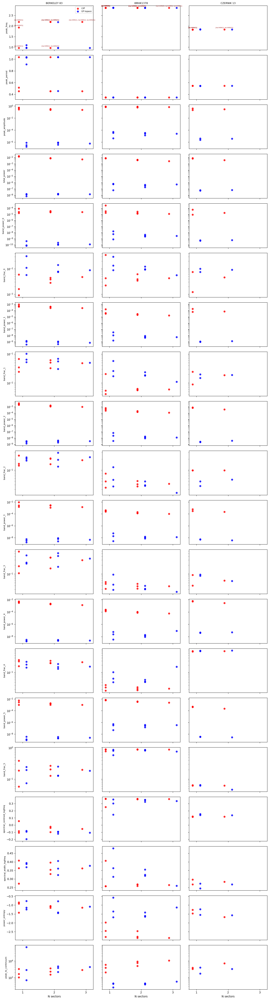

In [34]:
from visualize_gp_afterfit import plot_summary_stats

# One specific cluster — 1-column figure
plot_summary_stats(subset_summarystats)#, cluster_name="BERKELEY 83")

# # Random 4 clusters — 4-column figure
# plot_summary_stats(table, seed=42)

# # Subset of stats
# plot_summary_stats(table, cluster_name="BERKELEY 83",
#                  stats=["peak_freq", "peak_amplitude", "band_power_0", "band_power_1"])

In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,5))
plt.errorbar(out["t"], out["y"], yerr=out["yerr"], fmt=".", color='black', alpha=0.4, label='LC data')
plt.plot(out["t"], out["gp_mean"], color='red')
plt.fill_between(
    out["t"],
    out["gp_mean"] - out["gp_std"],
    out["gp_mean"] + out["gp_std"],
    alpha=0.5,
    color='blue',
    label='GP_fit'
)
plt.legend()
plt.xlabel("Time [days]")
plt.ylabel("Relative flux residual")
#plt.xlim([0, 27])
plt.ylim([-1e-3, 1e-3])
plt.show()

TypeError: 'GPFitResult' object is not subscriptable

<Figure size 1500x500 with 0 Axes>

In [105]:
import numpy as np
import matplotlib.pyplot as plt


def plot_gp_model_fft(out, n_uniform=4096, subtract_mean=True, window=True):
    """
    Take fitted GP model, sample posterior mean on a uniform grid,
    then FFT it.

    Parameters
    ----------
    out : dict
        Output from iterative_sho_gp_fit.
    n_uniform : int
        Number of points in uniform time grid.
    subtract_mean : bool
        Remove mean before FFT.
    window : bool
        Apply Hann window before FFT to reduce edge leakage.

    Returns
    -------
    freq : ndarray
        Frequencies in 1/day.
    power : ndarray
        FFT power of GP posterior mean.
    t_uniform : ndarray
        Uniform time grid.
    gp_uniform : ndarray
        GP posterior mean sampled on uniform grid.
    """

    t = np.asarray(out["t"])
    x = np.asarray(out["x"])
    y = np.asarray(out["y"])

    fit = out["final_fit"]
    gp = fit["gp"]

    # uniform grid over LC time range
    t_uniform = np.linspace(t.min(), t.max(), n_uniform)
    print(t.min())
    x_uniform = t_uniform - t.min()
    print(x_uniform)
    # condition GP on data and evaluate posterior mean at uniform grid
    cond_gp = gp.condition(
        np.asarray(y),
        np.asarray(x_uniform)
    ).gp

    gp_uniform = np.asarray(cond_gp.mean)

    if subtract_mean:
        gp_uniform = gp_uniform - np.nanmean(gp_uniform)

    if window:
        w = np.hanning(len(gp_uniform))
        gp_fft_input = gp_uniform * w
    else:
        gp_fft_input = gp_uniform

    dt = t_uniform[1] - t_uniform[0]

    fft_vals = np.fft.rfft(gp_fft_input)
    freq = np.fft.rfftfreq(len(gp_fft_input), d=dt)
    power = np.abs(fft_vals)**2

    plt.figure()
    plt.plot(freq, power)
    plt.xlabel("Frequency [1/day]")
    plt.ylabel("FFT Power")
    plt.title("FFT of GP Posterior Mean")
    plt.xlim([0, 10])
    plt.show()

    return freq, power, t_uniform, gp_uniform

In [106]:
1/80

0.0125

1764.7012939453125
[0.00000000e+00 6.09983414e-03 1.21996683e-02 ... 2.49666211e+01
 2.49727210e+01 2.49788208e+01]


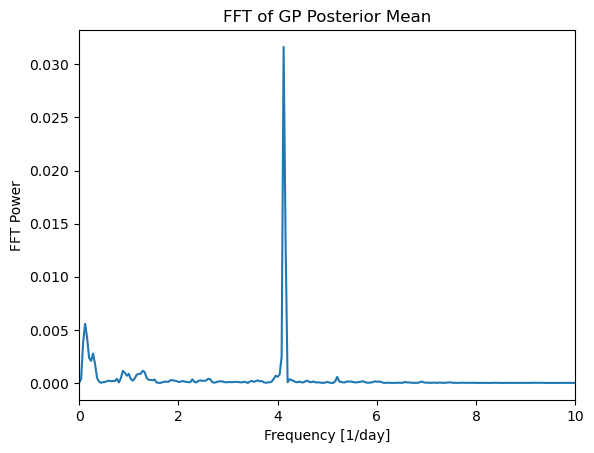

In [107]:
freq, power, t_grid, gp_grid = plot_gp_model_fft(out)

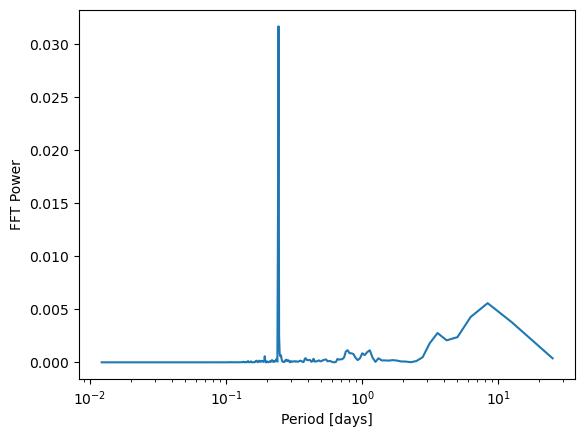

In [108]:
period = 1 / freq[1:]
period_power = power[1:]

plt.figure()
plt.plot(period, period_power)
plt.xlabel("Period [days]")
plt.ylabel("FFT Power")
plt.xscale("log")
#plt.yscale("log")
plt.show()